# Import Necessary Libraries

In [15]:
import os
from collections import Counter
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.utils import class_weight
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import shutil
from sklearn.utils.class_weight import compute_class_weight



In [2]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))
print("Built with CUDA:", tf.test.is_built_with_cuda())

TensorFlow version: 2.15.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Built with CUDA: True


2025-10-04 13:11:26.293418: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-10-04 13:11:26.330209: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-10-04 13:11:26.332384: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [16]:
# Định nghĩa tham số
img_size = (96, 96)  # Kích thước ảnh đầu vào
batch_size = 64
num_classes = 8
train_dir = 'affectnet/train/'
# train_dir = 'Affectnet/train_balanced/'
test_dir = 'affectnet/test'
val_dir = 'affectnet/val'


In [17]:
# Tạo thư mục val nếu chưa có
os.makedirs(val_dir, exist_ok=True)

# Lặp qua từng class
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    # Lấy toàn bộ file ảnh của class
    images = os.listdir(class_path)
    train_files, val_files = train_test_split(
        images, test_size=0.2, random_state=42
    )

    # Tạo thư mục class trong val_dir
    val_class_path = os.path.join(val_dir, class_name)
    os.makedirs(val_class_path, exist_ok=True)

    # Di chuyển (hoặc copy) ảnh sang val
    for f in val_files:
        src = os.path.join(class_path, f)
        dst = os.path.join(val_class_path, f)
        shutil.move(src, dst)  # dùng move nếu muốn giảm train còn 80%

# Prepare Data Generators for Image Processing

Found 16045 images belonging to 8 classes.
Found 4016 images belonging to 8 classes.
Found 4956 images belonging to 8 classes.


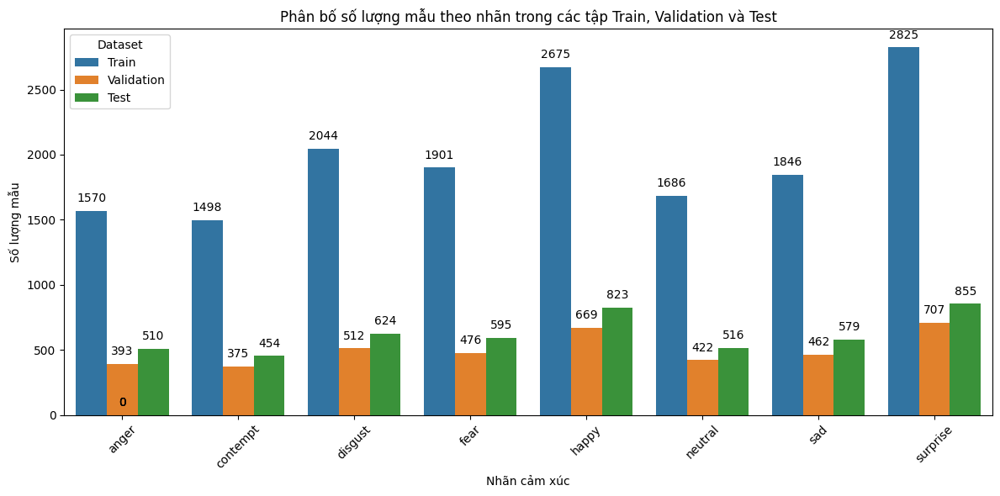

Train dataset sample counts per class:
anger: 1570
contempt: 1498
disgust: 2044
fear: 1901
happy: 2675
neutral: 1686
sad: 1846
surprise: 2825

Validation dataset sample counts per class:
anger: 393
contempt: 375
disgust: 512
fear: 476
happy: 669
neutral: 422
sad: 462
surprise: 707

Test dataset sample counts per class:
anger: 510
contempt: 454
disgust: 624
fear: 595
happy: 823
neutral: 516
sad: 579
surprise: 855


In [18]:
data_gen = ImageDataGenerator(rescale=1./255)

train_generator = data_gen.flow_from_directory(
    train_dir,
    target_size=img_size,
    color_mode='grayscale',
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_generator = data_gen.flow_from_directory(
    val_dir,
    target_size=img_size,
    color_mode='grayscale',
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = data_gen.flow_from_directory(
    test_dir,
    target_size=img_size,
    color_mode='grayscale',
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Lấy nhãn từ các generator
train_labels = train_generator.classes
val_labels = val_generator.classes
test_labels = test_generator.classes

# Lấy tên các lớp từ train_generator
class_names = list(train_generator.class_indices.keys())

# Đếm số lượng mẫu trong từng lớp
train_counts = Counter(train_labels)
val_counts = Counter(val_labels)
test_counts = Counter(test_labels)

# Tạo danh sách số lượng cho từng tập dữ liệu
train_data = [train_counts[i] for i in range(len(class_names))]
val_data = [val_counts[i] for i in range(len(class_names))]
test_data = [test_counts[i] for i in range(len(class_names))]

# Tạo DataFrame để trực quan hóa
data = {
    'Class': class_names * 3,
    'Count': train_data + val_data + test_data,
    'Dataset': ['Train'] * len(class_names) + ['Validation'] * len(class_names) + ['Test'] * len(class_names)
}
df = pd.DataFrame(data)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Class', y='Count', hue='Dataset', data=df)

# Thêm số liệu cụ thể
for p in ax.patches:
    height = p.get_height()
    if np.isfinite(height):
        ax.text(
            p.get_x() + p.get_width() / 2.,
            height + 50,
            f'{int(height)}',
            ha='center',
            va='bottom',
            fontsize=10
        )

plt.title('Phân bố số lượng mẫu theo nhãn trong các tập Train, Validation và Test')
plt.xlabel('Nhãn cảm xúc')
plt.ylabel('Số lượng mẫu')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print number of samples per class for Train dataset
print("Train dataset sample counts per class:")
for class_idx, count in train_counts.items():
    print(f"{class_names[class_idx]}: {count}")

# Print number of samples per class for Validation dataset
print("\nValidation dataset sample counts per class:")
for class_idx, count in val_counts.items():
    print(f"{class_names[class_idx]}: {count}")

# Print number of samples per class for Test dataset
print("\nTest dataset sample counts per class:")
for class_idx, count in test_counts.items():
    print(f"{class_names[class_idx]}: {count}")

# Balancing Training Data: Oversampling with Augmentation for Minority Classes and Undersampling to Enhance Generalization and Reduce Overfitting

In [ ]:
# import os, cv2, random, shutil, uuid
# import albumentations as A
# from tqdm import tqdm

# train_dir = "Affectnet/train"
# balanced_dir = "Affectnet/train_balanced"
# target_count = 2500 
# img_size = (96, 96)

# # -----------------------------
# # Pipeline augment
# # -----------------------------
# import albumentations as A

# transform = A.Compose([
#     # Lật ngang (khuôn mặt vẫn hợp lệ)
#     A.HorizontalFlip(p=0.5),

#     # Dịch/scale/rotate rất nhỏ để tránh méo
#     A.ShiftScaleRotate(
#         shift_limit=0.05, scale_limit=0.05, rotate_limit=5,
#         border_mode=cv2.BORDER_REFLECT_101, p=0.4
#     ),

#     # Biến đổi ánh sáng
#     A.RandomBrightnessContrast(
#         brightness_limit=0.15, contrast_limit=0.15, p=0.4
#     ),

#     # Gaussian noise nhẹ
#     A.GaussNoise(var_limit=(5.0, 15.0), p=0.2),

#     # Làm mờ mô phỏng rung camera
#     A.MotionBlur(blur_limit=3, p=0.15),

#     # Dropout để mô phỏng che khuất (tay, tóc, kính)
#     A.CoarseDropout(
#         max_holes=1, max_height=12, max_width=12,
#         min_holes=1, min_height=8, min_width=8,
#         fill_value=0, p=0.2
#     )
# ], p=0.7)


# # -----------------------------
# # Hàm augment và lưu ảnh
# # -----------------------------
# def augment_and_save(class_dir, save_dir, current_n, target_count, transform, img_size):
#     added_needed = target_count - current_n
#     if added_needed <= 0:
#         return
    
#     files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg','.jpeg','.png','.bmp'))]
#     random.shuffle(files)
#     sampled_files = random.choices(files, k=added_needed)
    
#     for f in sampled_files:
#         img = cv2.imread(os.path.join(class_dir, f))
#         if img is None:
#             continue
        
#         # Resize ảnh
#         img = cv2.resize(img, img_size)

#         # Augment trên ảnh màu (3 kênh)
#         aug = transform(image=img)["image"]

#         # Sau augment mới chuyển sang grayscale
#         aug_gray = cv2.cvtColor(aug, cv2.COLOR_BGR2GRAY)

#         out_name = f"{uuid.uuid4().hex[:8]}_{f}"
#         cv2.imwrite(os.path.join(save_dir, out_name), aug_gray)

# # -----------------------------
# # Hàm xây dataset (oversample đến 2500, không undersample)
# # -----------------------------
# def build_balanced_dataset(train_dir, balanced_dir, target_count):
#     if os.path.exists(balanced_dir):
#         shutil.rmtree(balanced_dir)
#     os.makedirs(balanced_dir, exist_ok=True)

#     for cls in tqdm(os.listdir(train_dir), desc="Processing classes"):
#         class_dir = os.path.join(train_dir, cls)
#         if not os.path.isdir(class_dir):
#             continue

#         save_dir = os.path.join(balanced_dir, cls)
#         os.makedirs(save_dir, exist_ok=True)

#         files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg','.jpeg','.png','.bmp'))]
#         n = len(files)

#         if n == 0:
#             continue

#         # Copy toàn bộ ảnh gốc (chuyển về grayscale đồng bộ)
#         for f in files:
#             img = cv2.imread(os.path.join(class_dir, f))
#             if img is None:
#                 continue
#             img = cv2.resize(img, img_size)
#             img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#             cv2.imwrite(os.path.join(save_dir, f), img)

#         current_n = n

#         # Oversample nếu thiếu
#         if n < target_count:
#             augment_and_save(class_dir, save_dir, current_n, target_count, transform, img_size)

#     # Thống kê
#     counts = {cls: len([f for f in os.listdir(os.path.join(balanced_dir, cls)) if f.lower().endswith(('.jpg','.jpeg','.png','.bmp'))]) for cls in os.listdir(balanced_dir)}
#     print("Tạo xong tập train cân bằng (oversampling to 2500):", balanced_dir)
#     print("\nSố lượng ảnh sau khi cân bằng:")
#     for cls, c in counts.items():
#         print(f"{cls}: {c}")


# build_balanced_dataset(train_dir, balanced_dir, target_count)


In [19]:
train_dir = "Affectnet/train"  # Tập train đã cân bằng

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,           # Giảm từ 15 → 10°: Nhẹ hơn, vẫn robust nhẹ với head tilts (benchmark: 10-15° tốt cho FER, tránh distort expressions)
    width_shift_range=0.1,       # Giảm từ 0.15 → 0.1: ~10% shift, đủ cho small pose shifts mà không crop mất features khuôn mặt
    height_shift_range=0.1,      # Tương tự, giảm từ 0.15 → 0.1
    shear_range=0.05,            # Giảm từ 0.1 → 0.05: Shear nhẹ hơn, chỉ simulate minor angle distortions (benchmark: 0.05-0.1 cho faces)
    zoom_range=[0.9, 1.1],       # Giảm từ [0.85,1.15] → [0.9,1.1]: ±10% zoom, giữ chi tiết mà tăng diversity scale (tương tự cropping 10-20% trong surveys)
    horizontal_flip=True,        # Giữ: Tốt cho symmetry khuôn mặt, cải thiện +4-10% acc theo evaluations
    brightness_range=[0.85, 1.15],  # Giảm từ [0.8,1.2] → [0.85,1.15]: ±15% brightness, conservative cho lighting variations (benchmark: ±15-20% cho in-the-wild data)
    channel_shift_range=15,      # Giảm từ 20 → 15: Nhẹ hơn cho color jitter (dù grayscale, simulate lighting shifts), tránh noise quá mức
    fill_mode='reflect'          # Giữ: Tốt cho faces, tránh artifacts biên
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    color_mode='grayscale',
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=img_size,
    color_mode='grayscale',
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    color_mode='grayscale',
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 17826 images belonging to 8 classes.
Found 4016 images belonging to 8 classes.
Found 4956 images belonging to 8 classes.


In [20]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Lấy nhãn từ train_generator
classes = train_generator.classes        # mảng số nguyên ứng với từng ảnh
class_labels = list(train_generator.class_indices.keys())  # tên lớp

# Tính class weight
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(classes),
    y=classes
)

# Đưa về dict dạng {class_index: weight}
class_weights = dict(enumerate(class_weights))

print("Class labels:", class_labels)
print("Class weights:", class_weights)

Class labels: ['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
Class weights: {0: 0.9683833116036505, 1: 1.0938880706921945, 2: 1.0137625113739763, 3: 1.145629820051414, 4: 0.8129332360452389, 5: 1.224313186813187, 6: 1.1660125588697017, 7: 0.7755830142707971}


# Model Architecture

In [21]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Dropout, 
                                     BatchNormalization, GlobalAveragePooling2D, 
                                     Dense, Activation)
from tensorflow.keras.regularizers import l2

input_shape = (96, 96, 1)
num_classes = 8

model = Sequential([
    # Block 1: 96x96 -> 48x48
    Conv2D(32, (3,3), padding='same', input_shape=input_shape, kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    Conv2D(32, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2,2)),
    Dropout(0.2),
    
    # Block 2: 48x48 -> 24x24
    Conv2D(64, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    Conv2D(64, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    Conv2D(64, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2,2)),
    Dropout(0.3),
    
    # Block 3: 24x24 -> 12x12
    Conv2D(128, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    Conv2D(128, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    Conv2D(128, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2,2)),
    Dropout(0.4),
    
    # Block 4: 12x12 -> 6x6 (THÊM POOL)
    Conv2D(256, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    Conv2D(256, (3,3), padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2,2)),  # ← THÊM: 12x12 -> 6x6
    Dropout(0.5),
    
    # Classification Head - ĐƠN GIẢN HƠN
    GlobalAveragePooling2D(),
    Dense(256, kernel_regularizer=l2(1e-3)),  # ← CHỈ 1 Dense layer
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 96, 96, 32)        320       
                                                                 
 batch_normalization_11 (Ba  (None, 96, 96, 32)        128       
 tchNormalization)                                               
                                                                 
 activation_11 (Activation)  (None, 96, 96, 32)        0         
                                                                 
 conv2d_11 (Conv2D)          (None, 96, 96, 32)        9248      
                                                                 
 batch_normalization_12 (Ba  (None, 96, 96, 32)        128       
 tchNormalization)                                               
                                                                 
 activation_12 (Activation)  (None, 96, 96, 32)       

# Training Callbacks: Training Optimization & Overfitting Preventation

In [ ]:
# Giảm LR khi val_loss không cải thiện
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

# Early stopping khi val_loss không cải thiện
early_stop = EarlyStopping(
    monitor='val_accuracy',
    patience=10,
    restore_best_weights=True,
    mode='max', 
    verbose=1
)

# Lưu model tốt nhất dựa trên val_accuracy
checkpoint = ModelCheckpoint(
    filepath='best_model.keras',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


# Train Model

In [23]:
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.losses import CategoricalCrossentropy
import tensorflow as tf

model.compile(
    optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
      loss=CategoricalCrossentropy(label_smoothing=0.05), 
   
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
    ]
)

In [24]:
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=100,
    class_weight=class_weights,
    callbacks=[reduce_lr, early_stop, checkpoint]
)

Epoch 1/100


2025-10-04 14:58:54.681229: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/dropout_5/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


279/279 [==============================] - ETA: 0s - loss: 2.6402 - accuracy: 0.1409 - precision: 0.1420 - recall: 0.0090
Epoch 1: val_accuracy improved from -inf to 0.09786, saving model to best_model.keras
279/279 [==============================] - 43s 140ms/step - loss: 2.6402 - accuracy: 0.1409 - precision: 0.1420 - recall: 0.0090 - val_loss: 2.4749 - val_accuracy: 0.0979 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 0.0010
Epoch 2/100
279/279 [==============================] - ETA: 0s - loss: 2.4209 - accuracy: 0.1755 - precision: 0.1700 - recall: 0.0062
Epoch 2: val_accuracy improved from 0.09786 to 0.17555, saving model to best_model.keras
279/279 [==============================] - 37s 132ms/step - loss: 2.4209 - accuracy: 0.1755 - precision: 0.1700 - recall: 0.0062 - val_loss: 2.3127 - val_accuracy: 0.1755 - val_precision: 0.3545 - val_recall: 0.0097 - lr: 0.0010
Epoch 3/100
279/279 [==============================] - ETA: 0s - loss: 2.2282 - accuracy: 0.2470 - prec

In [13]:
# Evaluate the model on the test generator
test_metrics = model.evaluate(test_generator, return_dict=True)

# Extract and print all available metrics
print("Kết quả trên tập kiểm tra:")
for metric_name, metric_value in test_metrics.items():
    print(f"{metric_name.capitalize()}: {metric_value:.4f}")

86/86 [==============================] - 4s 46ms/step - loss: 1.1674 - accuracy: 0.6683 - precision: 0.7804 - recall: 0.5549
Kết quả trên tập kiểm tra:
Loss: 1.1674
Accuracy: 0.6683
Precision: 0.7804
Recall: 0.5549


### Visualizing Training Performance

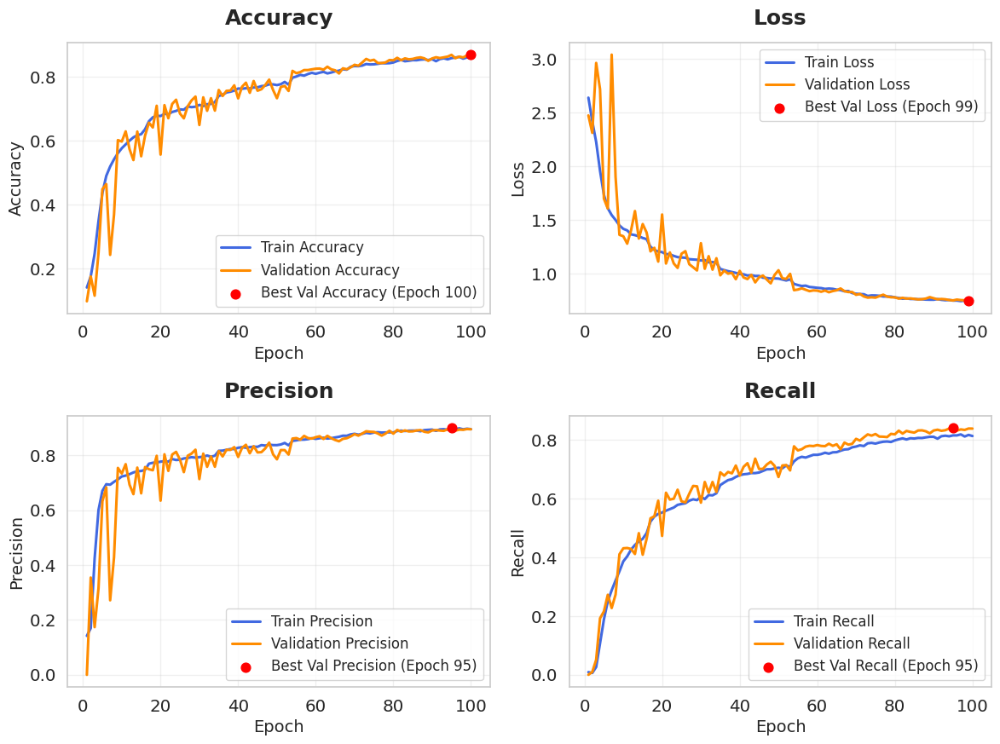

In [25]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid", font_scale=1.3)

def plot_training_metrics(history, save_path=None):
    """
    Plot training & validation metrics (accuracy, loss, precision, recall)
    với style chuyên nghiệp cho báo cáo.
    """
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)

        metrics_map = {
            "accuracy": "Accuracy",
            "loss": "Loss",
            "precision": "Precision",
            "recall": "Recall"
        }

        # Chỉ lấy những metric có trong history
        available_metrics = [m for m in metrics_map if m in history.history]

        n_metrics = len(available_metrics)
        n_cols = 2
        n_rows = int(np.ceil(n_metrics / n_cols))

        plt.figure(figsize=(6 * n_cols, 4.5 * n_rows))

        for i, metric in enumerate(available_metrics, 1):
            plt.subplot(n_rows, n_cols, i)

            # Train curve
            sns.lineplot(
                x=range(1, len(history.history[metric]) + 1),
                y=history.history[metric],
                label=f"Train {metrics_map[metric]}",
                color="royalblue",
                linewidth=2.2
            )
            # Val curve
            sns.lineplot(
                x=range(1, len(history.history[f'val_{metric}']) + 1),
                y=history.history[f'val_{metric}'],
                label=f"Validation {metrics_map[metric]}",
                color="darkorange",
                linewidth=2.2
            )

            # Highlight điểm tốt nhất trên Validation
            if metric == "loss":
                best_epoch = np.argmin(history.history[f'val_{metric}']) + 1
                best_value = np.min(history.history[f'val_{metric}'])
            else:
                best_epoch = np.argmax(history.history[f'val_{metric}']) + 1
                best_value = np.max(history.history[f'val_{metric}'])

            plt.scatter(best_epoch, best_value,
                        color="red", s=60, zorder=5,
                        label=f"Best Val {metrics_map[metric]} (Epoch {best_epoch})")

            plt.title(metrics_map[metric], fontsize=18, pad=15, weight="bold")
            plt.xlabel("Epoch", fontsize=14)
            plt.ylabel(metrics_map[metric], fontsize=14)
            plt.legend(fontsize=12, loc="best")
            plt.grid(alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches="tight")

        plt.show()

plot_training_metrics(history, save_path='training_metrics.png')


# Confusion Matrix

63/63 [==============================] - 2s 27ms/step


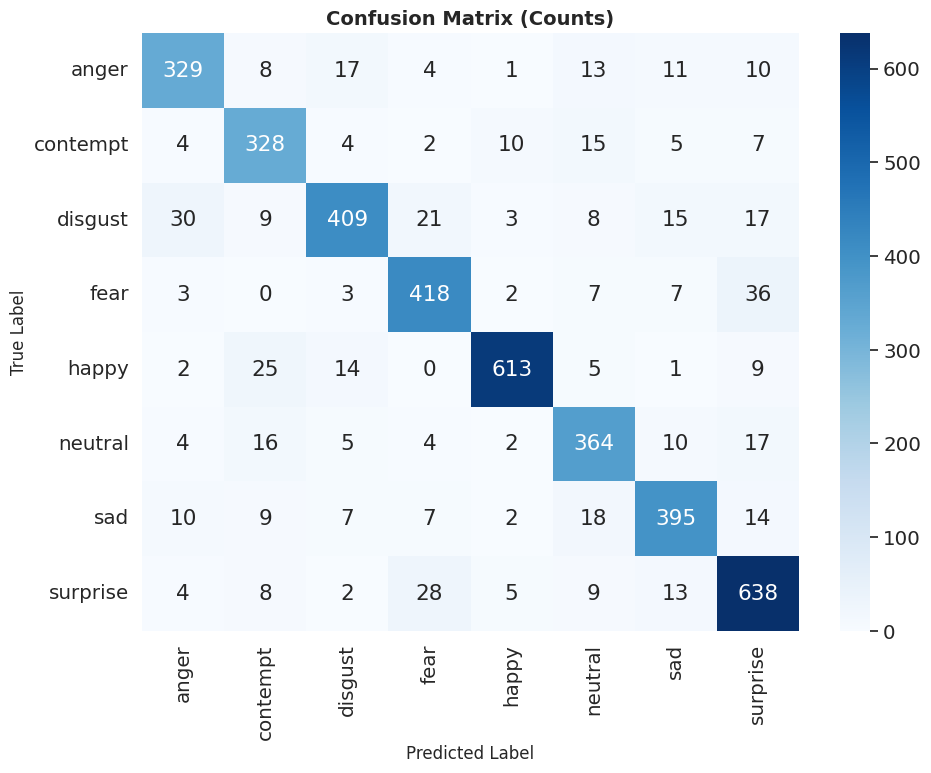

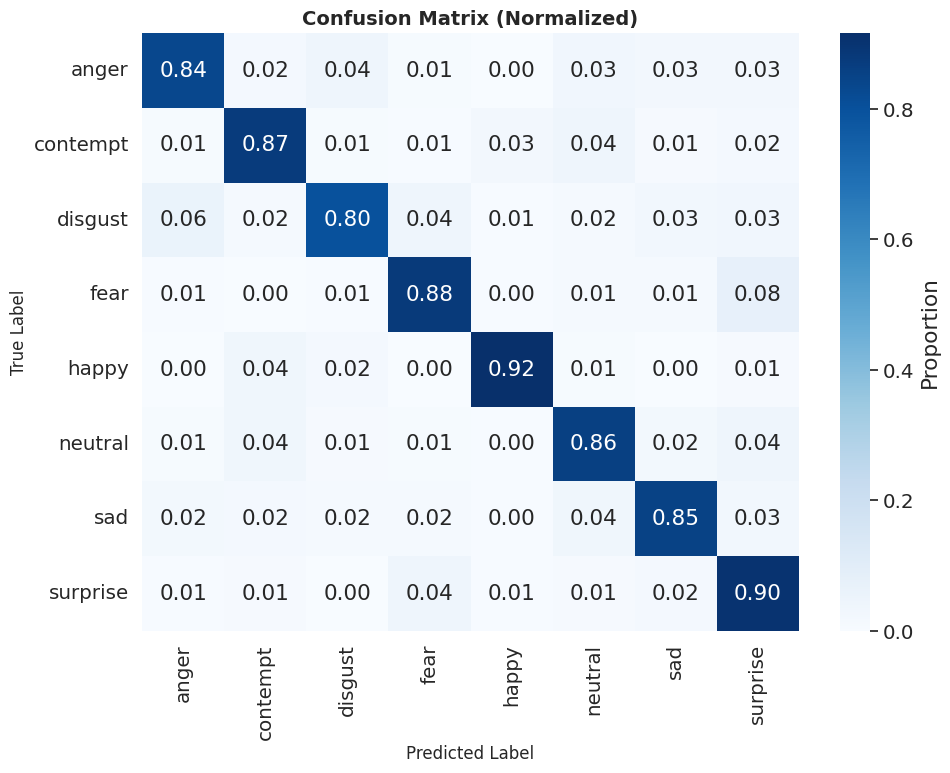


Classification Report:

              precision    recall  f1-score     support
anger          0.852332  0.837150  0.844673   393.00000
contempt       0.813896  0.874667  0.843188   375.00000
disgust        0.887202  0.798828  0.840699   512.00000
fear           0.863636  0.878151  0.870833   476.00000
happy          0.960815  0.916293  0.938026   669.00000
neutral        0.829157  0.862559  0.845528   422.00000
sad            0.864333  0.854978  0.859630   462.00000
surprise       0.852941  0.902405  0.876976   707.00000
accuracy       0.870020  0.870020  0.870020     0.87002
macro avg      0.865539  0.865629  0.864944  4016.00000
weighted avg   0.871652  0.870020  0.870177  4016.00000


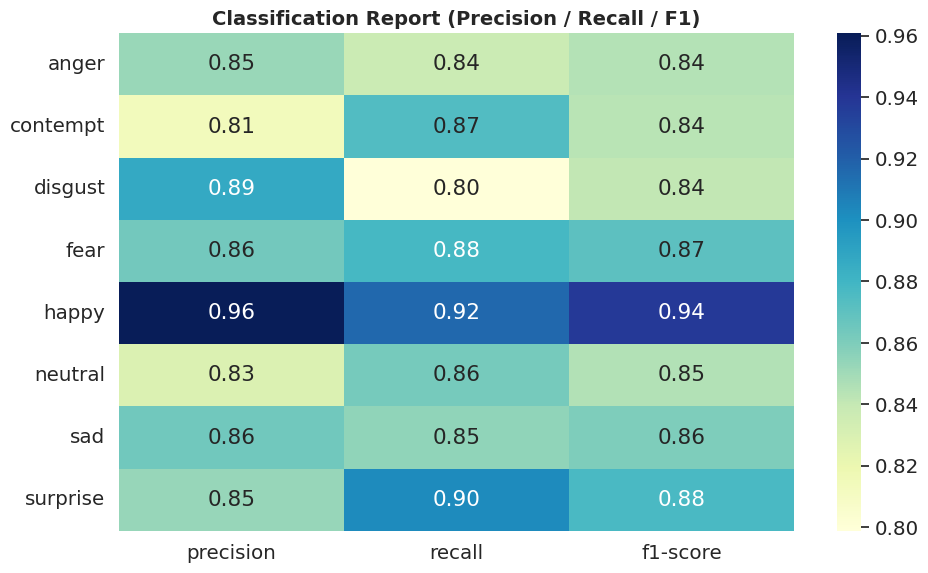


Top-5 Most Frequent Misclassifications:
1. fear → surprise: 36 samples (7.56%)
2. disgust → anger: 30 samples (5.86%)
3. surprise → fear: 28 samples (3.96%)
4. happy → contempt: 25 samples (3.74%)
5. disgust → fear: 21 samples (4.10%)


In [26]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report

# 1. Class labels
class_names = ["anger", "contempt", "disgust", "fear",
               "happy", "neutral", "sad", "surprise"]

# 2. Ground truth từ validation generator
y_true = val_generator.classes

# 3. Predict
y_pred_probs = model.predict(val_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)

# 4. Confusion matrix (counts + normalized)
cm = confusion_matrix(y_true, y_pred)
cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

# -------- Confusion Matrix (Counts) --------
plt.figure(figsize=(10, 8))
sns.heatmap(
    cm, annot=True, fmt="d", cmap="Blues",
    xticklabels=class_names, yticklabels=class_names
)
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.title("Confusion Matrix (Counts)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("confusion_matrix_counts.png", dpi=300)
plt.show()

# -------- Confusion Matrix (Normalized) --------
plt.figure(figsize=(10, 8))
sns.heatmap(
    cm_norm, annot=True, fmt=".2f", cmap="Blues",
    xticklabels=class_names, yticklabels=class_names,
    cbar_kws={'label': 'Proportion'}
)
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.title("Confusion Matrix (Normalized)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("confusion_matrix_normalized.png", dpi=300)
plt.show()

# 5. Classification report → DataFrame
report_dict = classification_report(
    y_true, y_pred, target_names=class_names, digits=4, output_dict=True
)
report_df = pd.DataFrame(report_dict).transpose()

print("\nClassification Report:\n")
print(report_df)

# 6. Xuất báo cáo ra CSV và Excel
report_df.to_csv("classification_report.csv", index=True)
report_df.to_excel("classification_report.xlsx", index=True)

# -------- Visualization (Precision, Recall, F1) --------
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-3, :-1], annot=True, cmap="YlGnBu", fmt=".2f")
plt.title("Classification Report (Precision / Recall / F1)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("classification_report_heatmap.png", dpi=300)
plt.show()

# 7. Error Analysis: Top-N misclassifications
cm_offdiag = cm.copy()
np.fill_diagonal(cm_offdiag, 0)

confusions = [
    (class_names[i], class_names[j], cm_offdiag[i, j], cm_norm[i, j])
    for i in range(len(class_names))
    for j in range(len(class_names))
    if cm_offdiag[i, j] > 0
]

confusions_sorted = sorted(confusions, key=lambda x: x[2], reverse=True)

print("\nTop-5 Most Frequent Misclassifications:")
for i, (true_cls, pred_cls, count, perc) in enumerate(confusions_sorted[:5], 1):
    print(f"{i}. {true_cls} → {pred_cls}: {count} samples ({perc*100:.2f}%)")


# Predictions Made

In [27]:
import numpy as np

pred_probs = model.predict(test_generator)
pred_classes = np.argmax(pred_probs, axis=1)
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

78/78 [==============================] - 4s 46ms/step


### Predicting 200 Random Images

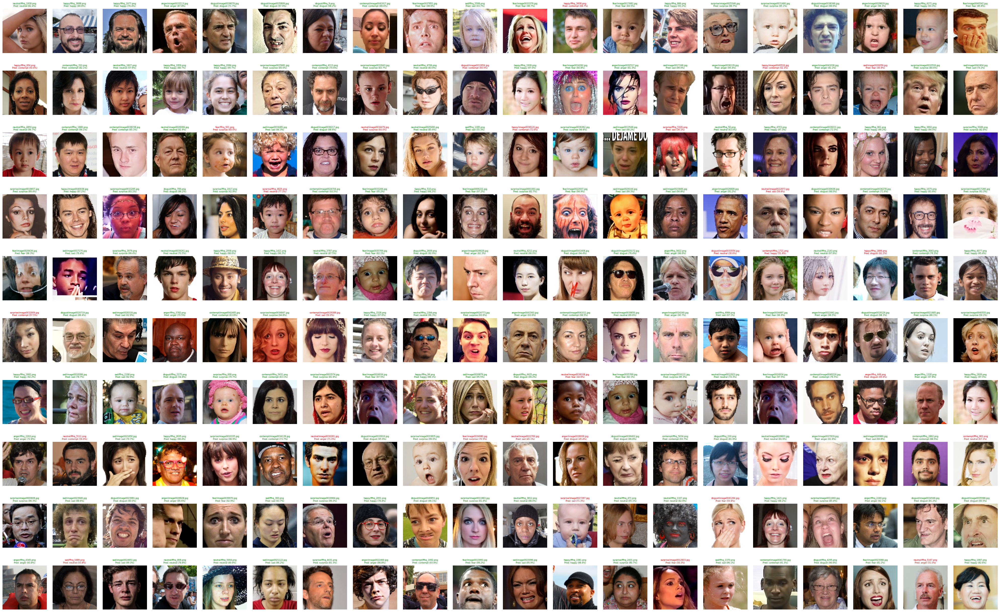

Correctly Predicted: 171 / 200


In [28]:
import matplotlib.pyplot as plt
import numpy as np
import os

filenames = test_generator.filepaths
plt.figure(figsize=(40, 25))

correct_count = 0

for i in range(200):
    index = np.random.randint(0, len(filenames))
    img_path = filenames[index]
    img = plt.imread(img_path)

    class_name = os.path.basename(os.path.dirname(img_path))
    filename = os.path.basename(img_path)

    true_label = class_labels[true_classes[index]]
    pred_label = class_labels[pred_classes[index]]
    confidence = np.max(pred_probs[index]) * 100

    if pred_label == true_label:
        correct_count += 1

    plt.subplot(10, 20, i + 1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    title_color = 'green' if pred_label == true_label else 'red'
    plt.title(f'{class_name}/{filename}\nPred: {pred_label} ({confidence:.1f}%)',
              fontsize=6, color=title_color)

plt.tight_layout()
plt.show()

#  Final summary
print(f'Correctly Predicted: {correct_count} / 200')

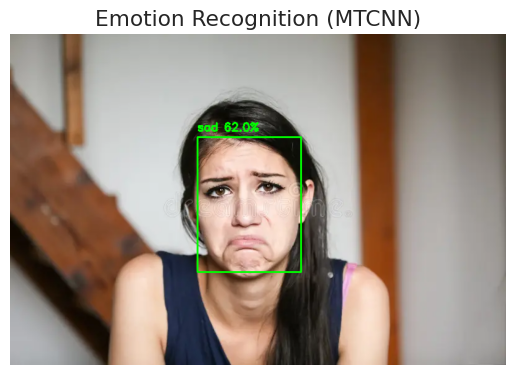

In [29]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from mtcnn import MTCNN
import os, time

# ===== Load model =====
model = load_model("best_model.keras")
emotion_labels = ['anger', 'contempt', 'disgust', 'fear',
                  'happy', 'neutral', 'sad', 'surprise']

# ===== Face detector (MTCNN) =====
detector = MTCNN()

# ===== Tiền xử lý khuôn mặt =====
def preprocess_face(face):
    face = cv2.resize(face, (96, 96))
    face = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)
    face = face.astype("float32") / 255.0
    face = np.expand_dims(face, axis=(0, -1))  # (1,96,96,1)
    return face

# ===== Xử lý 1 frame =====
def process_frame(frame):
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = detector.detect_faces(rgb)

    for res in results:
        x, y, w, h = res["box"]
        # fix nếu MTCNN trả về x,y âm
        x, y = max(0, x), max(0, y)

        face_roi = frame[y:y+h, x:x+w]
        if face_roi.size == 0: 
            continue

        face_input = preprocess_face(face_roi)
        preds = model.predict(face_input, verbose=0)[0]
        idx = np.argmax(preds)
        emotion, conf = emotion_labels[idx], preds[idx]*100

        # Vẽ box + nhãn
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
        label = f"{emotion} {conf:.1f}%"
        cv2.putText(frame, label, (x, y-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)
    return frame

# ===== Chọn input =====
input_path = input("Nhập đường dẫn ảnh (.jpg/.png) hoặc video (.mp4): ").strip()
if not os.path.exists(input_path):
    print("❌ File không tồn tại."); exit()

# ===== Ảnh =====
if input_path.lower().endswith((".jpg", ".jpeg", ".png")):
    frame = cv2.imread(input_path)
    frame = process_frame(frame)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    plt.imshow(frame_rgb); plt.axis("off")
    plt.title("Emotion Recognition (MTCNN)")
    plt.show()

# ===== Video =====
else:
    cap = cv2.VideoCapture(input_path)
    fps_start, frame_count = time.time(), 0
    print("▶ Đang xử lý video (nhấn 'q' để thoát)...")

    while True:
        ret, frame = cap.read()
        if not ret: break
        frame_count += 1

        if frame_count % 5 == 0:  # Skip để tăng tốc
            frame = process_frame(frame)

        cv2.imshow("Emotion Recognition (MTCNN)", frame)
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break

    cap.release(); cv2.destroyAllWindows()
    elapsed = time.time() - fps_start
    print(f"Hoàn tất. Frames: {frame_count}, FPS TB: {frame_count/elapsed:.2f}")
